<p style="align: center;"><img align=center src="https://s8.hostingkartinok.com/uploads/images/2018/08/308b49fcfbc619d629fe4604bceb67ac.jpg" width=500 height=450/></p>

<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

<h3 style="text-align: center;"><b>Домашнее задание. Продвинутый поток. Весна 2021</b></h3>

Это домашнее задание будет посвящено полноценному решению задачи машинного обучения.

Есть две части этого домашнего задания: 
* Сделать полноценный отчет о вашей работе: как вы обработали данные, какие модели попробовали и какие результаты получились (максимум 10 баллов). За каждую выполненную часть будет начислено определенное количество баллов.
* Лучшее решение отправить в соревнование на [kaggle](https://www.kaggle.com/c/advanced-dls-spring-2021/) (максимум 5 баллов). За прохождение определенного порогов будут начисляться баллы.


**Обе части будут проверяться в формате peer-review. Т.е. вашу посылку на степик будут проверять несколько других студентов и аггрегация их оценок будет выставлена. В то же время вам тоже нужно будет проверить несколько других учеников.**

**Пожалуйста, делайте свою работу чистой и понятной, чтобы облегчить проверку. Если у вас будут проблемы с решением или хочется совета, то пишите в наш чат в телеграме или в лс @runfme. Если вы захотите проаппелировать оценку, то пипшите в лс @runfme.**

**Во всех пунктах указания это минимальный набор вещей, которые стоит сделать. Если вы можете сделать какой-то шаг лучше или добавить что-то свое - дерзайте!**

# Как проверять?

Ставьте полный балл, если выполнены все рекомендации или сделано что-то более интересное и сложное. За каждый отсустствующий пункт из рекомендация снижайте 1 балл.

# Метрика

Перед решением любой задачи важно понимать, как будет оцениваться ваше решение. В данном случае мы используем стандартную для задачи классификации метрику ROC-AUC. Ее можно вычислить используя только предсказанные вероятности и истинные классы без конкретного порога классификации + она раотает даже если классы в данных сильно несбалансированны (примеров одного класса в десятки раз больше примеров длугого). Именно поэтому она очень удобна для соревнований.

Посчитать ее легко:


In [1]:
from sklearn.metrics import roc_auc_score

y_true = [
    0,
    1,
    1,
    0,
    1
]

y_predictions = [
    0.1,
    0.9,
    0.4,
    0.6,
    0.61
]

roc_auc_score(y_true, y_predictions)

0.8333333333333333

# Первая часть. Исследование

In [2]:
import pandas as pd
import numpy as np

from matplotlib import pyplot as plt
import seaborn as sns

## Загрузка данных (2 балла)

1) Посмотрите на случайные строчки. 

2) Посмотрите, есть ли в датасете незаполненные значения (nan'ы) с помощью data.isna() или data.info() и, если нужно, замените их на что-то. Будет хорошо, если вы построите табличку с количеством nan в каждой колонке.

In [3]:
# Для вашего удобства списки с именами разных колонок

# Числовые признаки
num_cols = [
    'ClientPeriod',
    'MonthlySpending',
    'TotalSpent'
]

# Категориальные признаки
cat_cols = [
    'Sex',
    'IsSeniorCitizen',
    'HasPartner',
    'HasChild',
    'HasPhoneService',
    'HasMultiplePhoneNumbers',
    'HasInternetService',
    'HasOnlineSecurityService',
    'HasOnlineBackup',
    'HasDeviceProtection',
    'HasTechSupportAccess',
    'HasOnlineTV',
    'HasMovieSubscription',
    'HasContractPhone',
    'IsBillingPaperless',
    'PaymentMethod'
]

feature_cols = num_cols + cat_cols
target_col = 'Churn'

Загружаем данные и смотрим строчки.

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
data = pd.read_csv('/content/drive/MyDrive/DLS Kaggle/train.csv')
test_data = pd.read_csv('/content/drive/MyDrive/DLS Kaggle/test.csv')

Первые 5 строчек тренировачного датасета:

In [6]:
data.head(5)

,ClientPeriod,MonthlySpending,TotalSpent,Sex,IsSeniorCitizen,HasPartner,HasChild,HasPhoneService,HasMultiplePhoneNumbers,HasInternetService,HasOnlineSecurityService,HasOnlineBackup,HasDeviceProtection,HasTechSupportAccess,HasOnlineTV,HasMovieSubscription,HasContractPhone,IsBillingPaperless,PaymentMethod,Churn
0,55,19.50,1026.35,Male,0,Yes,Yes,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,One year,No,Mailed check,0
1,72,25.85,1872.2,Male,0,Yes,No,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Credit card (automatic),0
2,1,75.90,75.9,Male,0,No,No,Yes,No,Fiber optic,No,No,No,Yes,No,No,Month-to-month,Yes,Electronic check,1
3,32,79.30,2570,Female,1,Yes,No,Yes,Yes,Fiber optic,No,No,Yes,No,No,No,Month-to-month,No,Mailed check,0
4,60,115.25,6758.45,Female,0,Yes,Yes,Yes,Yes,Fiber optic,Yes,Yes,Yes,Yes,Yes,Yes,Two year,No,Credit card (automatic),0


Смотрим на свойства нашего датасета.

In [7]:
data.shape

(5282, 20)

По условию данные в столбце "TotalSpent"  - числовой признак, а у нас они строчного вида:

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5282 entries, 0 to 5281
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ClientPeriod              5282 non-null   int64  
 1   MonthlySpending           5282 non-null   float64
 2   TotalSpent                5282 non-null   object 
 3   Sex                       5282 non-null   object 
 4   IsSeniorCitizen           5282 non-null   int64  
 5   HasPartner                5282 non-null   object 
 6   HasChild                  5282 non-null   object 
 7   HasPhoneService           5282 non-null   object 
 8   HasMultiplePhoneNumbers   5282 non-null   object 
 9   HasInternetService        5282 non-null   object 
 10  HasOnlineSecurityService  5282 non-null   object 
 11  HasOnlineBackup           5282 non-null   object 
 12  HasDeviceProtection       5282 non-null   object 
 13  HasTechSupportAccess      5282 non-null   object 
 14  HasOnlin

Проверим данные на пропуски:

In [9]:
data.isna().any()

ClientPeriod                False
MonthlySpending             False
TotalSpent                  False
Sex                         False
IsSeniorCitizen             False
HasPartner                  False
HasChild                    False
HasPhoneService             False
HasMultiplePhoneNumbers     False
HasInternetService          False
HasOnlineSecurityService    False
HasOnlineBackup             False
HasDeviceProtection         False
HasTechSupportAccess        False
HasOnlineTV                 False
HasMovieSubscription        False
HasContractPhone            False
IsBillingPaperless          False
PaymentMethod               False
Churn                       False
dtype: bool

Пропусков у нас нет, а вот пустые строки присутствуют:

In [10]:
(data == ' ').sum()

ClientPeriod                0
MonthlySpending             0
TotalSpent                  9
Sex                         0
IsSeniorCitizen             0
HasPartner                  0
HasChild                    0
HasPhoneService             0
HasMultiplePhoneNumbers     0
HasInternetService          0
HasOnlineSecurityService    0
HasOnlineBackup             0
HasDeviceProtection         0
HasTechSupportAccess        0
HasOnlineTV                 0
HasMovieSubscription        0
HasContractPhone            0
IsBillingPaperless          0
PaymentMethod               0
Churn                       0
dtype: int64

Для заполнения пропусков используем среднее заначение:

In [11]:
data.loc[data['TotalSpent'] != " "]['TotalSpent'].astype(float).mean()

2291.3904608382404

Так же приведем тип наших данных к "float":

In [12]:
data.TotalSpent = (np.where(data.TotalSpent == ' ', '2291.390461', data.TotalSpent)).astype(float)

In [ ]:
data.TotalSpent = (np.where(data.TotalSpent == ' ', '1', data.TotalSpent)).astype(float)

In [13]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5282 entries, 0 to 5281
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ClientPeriod              5282 non-null   int64  
 1   MonthlySpending           5282 non-null   float64
 2   TotalSpent                5282 non-null   float64
 3   Sex                       5282 non-null   object 
 4   IsSeniorCitizen           5282 non-null   int64  
 5   HasPartner                5282 non-null   object 
 6   HasChild                  5282 non-null   object 
 7   HasPhoneService           5282 non-null   object 
 8   HasMultiplePhoneNumbers   5282 non-null   object 
 9   HasInternetService        5282 non-null   object 
 10  HasOnlineSecurityService  5282 non-null   object 
 11  HasOnlineBackup           5282 non-null   object 
 12  HasDeviceProtection       5282 non-null   object 
 13  HasTechSupportAccess      5282 non-null   object 
 14  HasOnlin

In [14]:
(data == ' ').sum()

ClientPeriod                0
MonthlySpending             0
TotalSpent                  0
Sex                         0
IsSeniorCitizen             0
HasPartner                  0
HasChild                    0
HasPhoneService             0
HasMultiplePhoneNumbers     0
HasInternetService          0
HasOnlineSecurityService    0
HasOnlineBackup             0
HasDeviceProtection         0
HasTechSupportAccess        0
HasOnlineTV                 0
HasMovieSubscription        0
HasContractPhone            0
IsBillingPaperless          0
PaymentMethod               0
Churn                       0
dtype: int64

## Анализ данных (3 балла)

1) Для численных призанков постройте гистограмму (*plt.hist(...)*) или boxplot (*plt.boxplot(...)*). Для категориальных посчитайте количество каждого значения для каждого признака. Для каждой колонки надо сделать *data.value_counts()* и построить bar диаграммы *plt.bar(...)* или круговые диаграммы *plt.pie(...)* (хорошо, елси вы сможете это сделать на одном гарфике с помощью *plt.subplots(...)*). 

2) Посмотрите на распределение целевой переменной и скажите, являются ли классы несбалансированными.

3) (Если будет желание) Поиграйте с разными библиотеками для визуализации - *sns*, *pandas_visual_analysis*, etc.

Второй пункт очень важен, потому что существуют задачи классификации с несбалансированными классами. Например, это может значить, что в датасете намного больше примеров 0 класса. В таких случаях нужно 1) не использовать accuracy как метрику 2) использовать методы борьбы с imbalanced dataset (обычно если датасет сильно несбалансирован, т.е. класса 1 в 20 раз меньше класса 0).

In [ ]:
num_data = data[num_cols]
num_data

,ClientPeriod,MonthlySpending,TotalSpent
0,55,19.50,1026.35
1,72,25.85,1872.20
2,1,75.90,75.90
3,32,79.30,2570.00
4,60,115.25,6758.45
...,...,...,...
5277,3,30.40,82.15
5278,50,44.45,2188.45
5279,1,55.05,55.05
5280,29,76.00,2215.25


Text(0.5, -0.01, 'Total Spent')

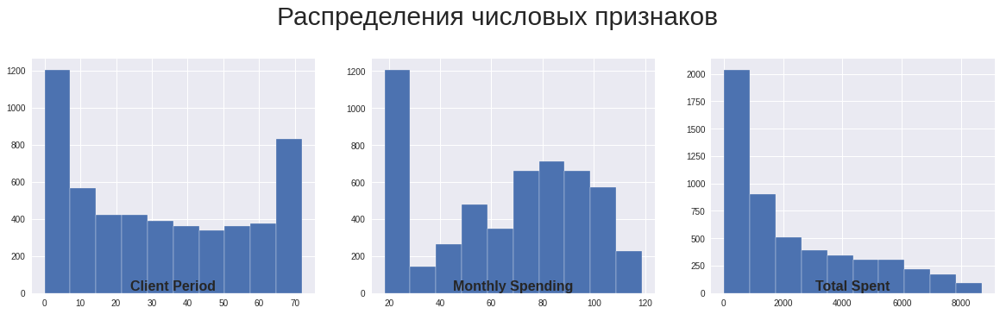

In [ ]:
sns.set()
f, axs = plt.subplots(1, 3,figsize=(20,5))
f.suptitle('Распределения числовых признаков', fontsize=30,  y=1.05)
plt.style.use("seaborn")
font = {'weight': "bold", "size": 16}
ax = axs.ravel()

plt.subplot(1, 3, 1)
plt.hist(num_data['ClientPeriod'])
plt.title("Client Period", y=-0.01, fontdict=font)

plt.subplot(1, 3, 2)
plt.hist(num_data['MonthlySpending'])
plt.title("Monthly Spending", y=-0.01, fontdict=font)

plt.subplot(1, 3, 3)
plt.hist(num_data['TotalSpent'])
plt.title("Total Spent", y=-0.01, fontdict=font)

In [ ]:
cat_data = data[cat_cols]
cat_data

,Sex,IsSeniorCitizen,HasPartner,HasChild,HasPhoneService,HasMultiplePhoneNumbers,HasInternetService,HasOnlineSecurityService,HasOnlineBackup,HasDeviceProtection,HasTechSupportAccess,HasOnlineTV,HasMovieSubscription,HasContractPhone,IsBillingPaperless,PaymentMethod
0,Male,0,Yes,Yes,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,One year,No,Mailed check
1,Male,0,Yes,No,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Credit card (automatic)
2,Male,0,No,No,Yes,No,Fiber optic,No,No,No,Yes,No,No,Month-to-month,Yes,Electronic check
3,Female,1,Yes,No,Yes,Yes,Fiber optic,No,No,Yes,No,No,No,Month-to-month,No,Mailed check
4,Female,0,Yes,Yes,Yes,Yes,Fiber optic,Yes,Yes,Yes,Yes,Yes,Yes,Two year,No,Credit card (automatic)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5277,Male,0,No,No,No,No phone service,DSL,No,No,No,Yes,No,No,Month-to-month,No,Electronic check
5278,Male,0,Yes,No,No,No phone service,DSL,Yes,No,No,Yes,Yes,No,One year,Yes,Bank transfer (automatic)
5279,Male,0,No,No,Yes,No,DSL,No,No,Yes,Yes,No,No,Month-to-month,No,Mailed check
5280,Female,0,No,No,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Credit card (automatic)


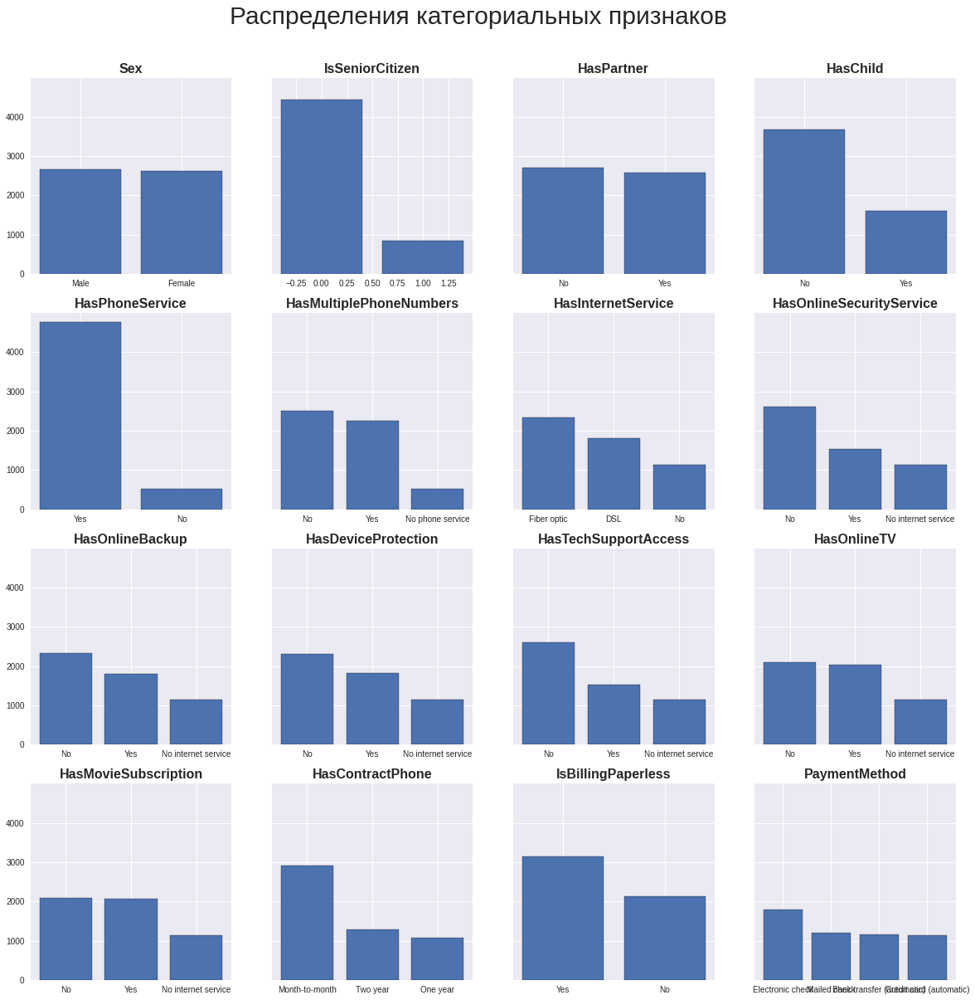

In [ ]:
plt.style.use("seaborn")
nrows, ncols = 4, 4
fig, axes = plt.subplots(nrows, ncols, figsize=(20, 20), sharey=True)
ax = axes.ravel()
fig.suptitle('Распределения категориальных признаков', fontsize=30, y=0.94)
for i, cat in enumerate(cat_cols):
    x = data[cat].value_counts()
    index = x.index
    ax[i].bar(x=index, height=x, edgecolor='black') #color=['lightgray', 'gray', 'red', 'black']
    ax[i].set_title(cat, fontdict=font)

Посмотрим на распределение целевой переменной:

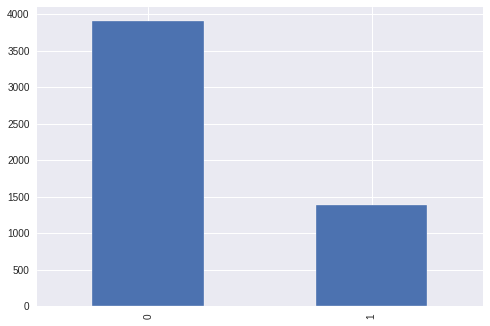

In [ ]:
data[target_col].value_counts().sort_values(ascending=False).plot(kind = 'bar')

Присутствует дисбаланс, возможное решение - аугментация данных (нет).

(Дополнительно) Если вы нашли какие-то ошибки в данных или выбросы, то можете их убрать. Тут можно поэксперементировать с обработкой данных как угодно, но не за баллы.

### Попытка Imbalanced Learn. Особо на результат данной модели не повлияет, но все же.

In [ ]:
from imblearn.over_sampling import BorderlineSMOTE, SMOTE, ADASYN, SMOTENC, RandomOverSampler
from imblearn.under_sampling import (RandomUnderSampler, 
                                    NearMiss, 
                                    InstanceHardnessThreshold,
                                    CondensedNearestNeighbour,
                                    EditedNearestNeighbours,
                                    RepeatedEditedNearestNeighbours,
                                    AllKNN,
                                    NeighbourhoodCleaningRule,
                                    OneSidedSelection,
                                    TomekLinks)
from imblearn.combine import SMOTEENN, SMOTETomek
from imblearn.pipeline import make_pipeline

In [ ]:
from imblearn.over_sampling import SMOTENC
smote_nc = SMOTENC(categorical_features=[11, 18], random_state=0, sampling_strategy={1: 1200})
X_resampled, y_resampled = smote_nc.fit_resample(X_train, y_train)
clf.fit(X_resampled, y_resampled)

LogisticRegressionCV(Cs=array([1.00000000e-03, 1.48735211e-03, 2.21221629e-03, 3.29034456e-03,
       4.89390092e-03, 7.27895384e-03, 1.08263673e-02, 1.61026203e-02,
       2.39502662e-02, 3.56224789e-02, 5.29831691e-02, 7.88046282e-02,
       1.17210230e-01, 1.74332882e-01, 2.59294380e-01, 3.85662042e-01,
       5.73615251e-01, 8.53167852e-01, 1.26896100e+00, 1.88739182e+00,
       2.80721620e+00, 4.17531894e+00, 6.21016942e+00, 9.23670857e+00,
       1.37382380e+01, 2.04335972e+01, 3.03919538e+01, 4.52035366e+01,
       6.72335754e+01, 1.00000000e+02]),
                     random_state=777, scoring='roc_auc')

In [ ]:
tatget_dict = data['Churn'].value_counts().to_dict()

In [ ]:
tatget_dict

{0: 3898, 1: 1384}

In [ ]:
roc_auc_score(y_val, clf.predict_proba(X_val)[:, 1])

0.8597370766488414

In [ ]:
roc_auc_score(y_val, clf.predict_proba(X_val)[:, 1])

0.8576144572661601

## Применение линейных моделей (3 балла)

1) Обработайте данные для того, чтобы к ним можно было применить LogisticRegression. Т.е. отнормируйте числовые признаки, а категориальные закодируйте с помощью one-hot-encoding'а. 

2) С помощью кроссвалидации или разделения на train/valid выборку протестируйте разные значения гиперпараметра C и выберите лучший (можно тестировать С=100, 10, 1, 0.1, 0.01, 0.001) по метрике ROC-AUC. 

Если вы разделяете на train/valid, то используйте LogisticRegressionCV. Он сам при вызове .fit() подберет параметр С. (не забудьте передать scroing='roc_auc', чтобы при кроссвалидации сравнивались значения этой метрики, и refit=True, чтобы при потом модель обучилась на всем датасете с лучшим параметром C). 


(более сложный вариант) Если вы будете использовать кроссвалидацию, то преобразования данных и LogisticRegression нужно соединить в один Pipeline с помощью make_pipeline, как это делалось во втором семинаре. Потом pipeline надо передать в GridSearchCV. Для one-hot-encoding'a можно испльзовать комбинацию LabelEncoder + OneHotEncoder (сначала превращаем строчки в числа, а потом числа првращаем в one-hot вектора.)

In [15]:
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, RobustScaler, LabelEncoder, OneHotEncoder
from sklearn.pipeline import make_pipeline

from sklearn.metrics import roc_auc_score, roc_curve, confusion_matrix

Применим к нашим категориям кодировщик для получения числовых значений классов:

In [ ]:
train_data = data[feature_cols].apply(LabelEncoder().fit_transform)

Произведем номализацию числовых признаков:

In [ ]:
train_data[num_cols] = RobustScaler().fit_transform(train_data[num_cols])

In [ ]:
train_data

,ClientPeriod,MonthlySpending,TotalSpent,Sex,IsSeniorCitizen,HasPartner,HasChild,HasPhoneService,HasMultiplePhoneNumbers,HasInternetService,HasOnlineSecurityService,HasOnlineBackup,HasDeviceProtection,HasTechSupportAccess,HasOnlineTV,HasMovieSubscription,HasContractPhone,IsBillingPaperless,PaymentMethod
0,0.565217,-0.772522,-0.168255,1,0,1,1,1,0,2,1,1,1,1,1,1,1,0,3
1,0.934783,-0.667671,0.150749,1,0,1,0,1,2,2,1,1,1,1,1,1,2,0,1
2,-0.608696,0.119313,-0.807041,1,0,0,0,1,0,1,0,0,0,2,0,0,0,1,2
3,0.065217,0.188008,0.297024,0,1,1,0,1,2,1,0,0,2,0,0,0,0,0,3
4,0.673913,0.935221,0.894962,0,0,1,1,1,2,1,2,2,2,2,2,2,2,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5277,-0.565217,-0.620669,-0.792258,1,0,0,0,0,1,0,0,0,0,2,0,0,0,0,2
5278,0.456522,-0.473637,0.217273,1,0,1,0,0,1,0,2,0,0,2,2,0,1,1,0
5279,-0.608696,-0.289244,-0.849446,1,0,0,0,1,0,0,0,0,2,2,0,0,0,0,3
5280,0.000000,0.121723,0.225832,0,0,0,0,1,2,1,0,0,0,0,0,0,0,1,1


Создадим массив целевых значений:

In [16]:
y = data[target_col]

In [ ]:
y = np.array(y)

Повторим прероцессинг для тестового массива данных:

In [ ]:
X_test = test_data[feature_cols].apply(LabelEncoder().fit_transform)

In [ ]:
X_test[num_cols] = RobustScaler().fit_transform(X_test[num_cols])

In [ ]:
X_test

,ClientPeriod,MonthlySpending,TotalSpent,Sex,IsSeniorCitizen,HasPartner,HasChild,HasPhoneService,HasMultiplePhoneNumbers,HasInternetService,HasOnlineSecurityService,HasOnlineBackup,HasDeviceProtection,HasTechSupportAccess,HasOnlineTV,HasMovieSubscription,HasContractPhone,IsBillingPaperless,PaymentMethod
0,0.276596,-0.216700,-0.341520,1,0,1,0,1,2,0,2,0,0,0,0,0,1,0,1
1,0.000000,0.667992,-0.187135,1,1,1,0,1,2,1,0,0,2,0,2,2,0,1,2
2,-0.425532,0.161034,0.633918,1,0,0,0,1,2,1,0,0,0,0,0,0,0,1,2
3,0.808511,0.079523,0.247953,0,0,1,1,1,2,0,2,2,0,2,2,0,2,0,1
4,0.893617,-0.735586,-0.769591,0,0,1,1,1,0,2,1,1,1,1,1,1,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1756,0.893617,0.825050,0.770760,0,0,1,0,1,2,1,0,2,2,0,2,2,2,1,0
1757,-0.340426,-0.707753,-0.250292,0,0,1,1,1,0,2,1,1,1,1,1,1,2,0,3
1758,-0.574468,0.526839,-0.610526,1,0,1,0,1,2,1,0,0,2,0,2,0,0,1,2
1759,-0.212766,0.455268,-0.649123,0,0,1,0,1,2,1,0,2,0,0,0,2,0,1,2


Разобьем данные для валидации модели:

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(train_data, y, test_size=0.25, random_state=777)

Зададим массив для значений обратной силы регуляризации:

In [ ]:
Cs = np.logspace(-3, 2, 30)

Объявляем модель, будем использовать LogisticRegressionCV:

In [ ]:
clf = LogisticRegressionCV(Cs=Cs, random_state=777, scoring='roc_auc', solver='lbfgs')

Тестируем модель с различным значение гиперпараметра по метрике ROC-AUC:

In [ ]:
clf.fit(X_train, y_train)

LogisticRegressionCV(Cs=array([1.00000000e-03, 1.48735211e-03, 2.21221629e-03, 3.29034456e-03,
       4.89390092e-03, 7.27895384e-03, 1.08263673e-02, 1.61026203e-02,
       2.39502662e-02, 3.56224789e-02, 5.29831691e-02, 7.88046282e-02,
       1.17210230e-01, 1.74332882e-01, 2.59294380e-01, 3.85662042e-01,
       5.73615251e-01, 8.53167852e-01, 1.26896100e+00, 1.88739182e+00,
       2.80721620e+00, 4.17531894e+00, 6.21016942e+00, 9.23670857e+00,
       1.37382380e+01, 2.04335972e+01, 3.03919538e+01, 4.52035366e+01,
       6.72335754e+01, 1.00000000e+02]),
                     random_state=777, scoring='roc_auc')

Посмотрим на наше лучшее значение параметра С:

In [ ]:
best_C = clf.C_[0]
best_C

30.39195382313201

Построим графики процесса обучения:

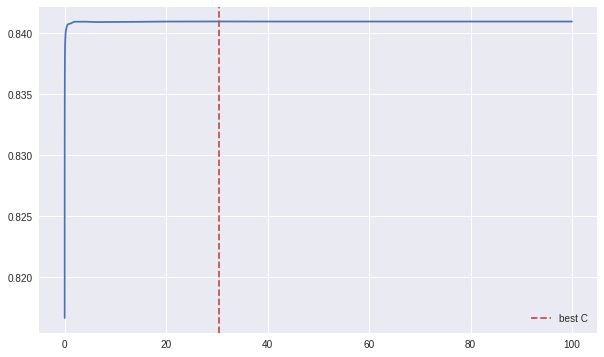

In [ ]:
plt.figure(figsize=(10, 6))
sns.lineplot(y=clf.scores_[1].mean(axis=0), x=clf.Cs_)
plt.axvline(clf.C_, ls='--', color='r', label='best C')
plt.legend()

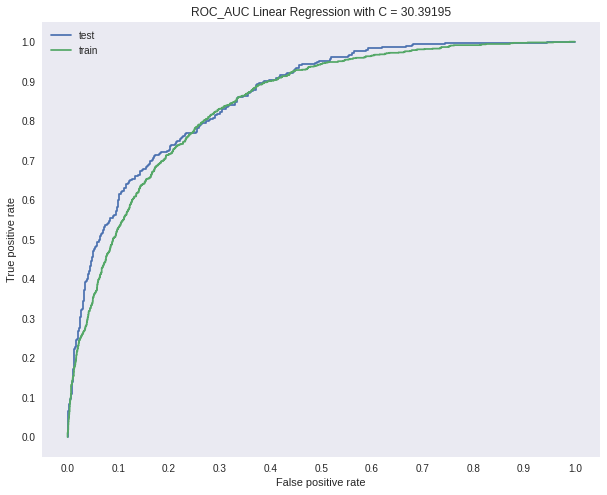

In [ ]:
y_train_predicted = clf.predict_proba(X_train)[:, 1]
y_test_predicted = clf.predict_proba(X_val)[:, 1]
fig, ax = plt.subplots(figsize=(10, 8))
ax.plot(*roc_curve(y_val, y_test_predicted)[:2], label='test')
ax.plot(*roc_curve(y_train, y_train_predicted)[:2], label='train')
ax.legend()
ax.set(xlabel='False positive rate', ylabel='True positive rate', title=f'ROC_AUC Linear Regression with C = {round(best_C, 5)}')
ax.grid()
ax.set_yticks(np.linspace(0, 1, 11))
ax.set_xticks(np.linspace(0, 1, 11));

Выведем наш скор:

In [ ]:
roc_auc_score(y_val, clf.predict_proba(X_val)[:, 1])

0.8595934187071957

Посморим на результаты валидации построив матрицу различий:

In [ ]:
cnf_matrix = confusion_matrix(y_val, clf.predict(X_val))

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from sklearn import metrics
import itertools

Confusion matrix, without normalization
[[890  79]
 [161 191]]


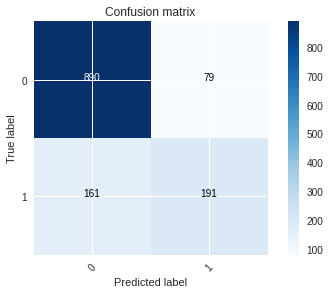

In [ ]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['0','1'],
                      title='Confusion matrix')

Выпишите какое лучшее качество и с какими параметрами вам удалось получить

roc_auc = 0.8595934187071957; C = 30.39195382313201

## Применение градиентного бустинга (2 балла)

Если вы хотите получить баллы за точный ответ, то стоит попробовать градиентный бустинг. Часто градиентный бустинг с дефолтными параметрами даст вам 80% результата за 0% усилий.

Мы будем использовать catboost, поэтому нам не надо кодировать категориальные признаки. catboost сделает это сам (в .fit() надо передать cat_features=cat_cols). А численные признаки нормировать для моделей, основанных на деревьях не нужно.

1) Разделите выборку на train/valid. Протестируйте catboost cо стандартными параметрами.

2) Протестируйте разные занчения параметроа количества деревьев и learning_rate'а и выберите лучшую по метрике ROC-AUC комбинацию. 

(Дополнительно) Есть некоторые сложности с тем, чтобы использовать CatBoostClassifier вместе с GridSearchCV, поэтому мы не просим использовать кроссвалидацию. Но можете попробовать)

Установим Catboost:

In [17]:
!pip install catboost
!pip install ipywidgets
!jupyter nbextension enable --py widgetsnbextension


     |████████████████████████████████| 76.6 MB 1.3 MB/s 
Enabling notebook extension jupyter-js-widgets/extension...
Paths used for configuration of notebook: 
    	/root/.jupyter/nbconfig/notebook.json
      - Validating: OK
Paths used for configuration of notebook: 
    	/root/.jupyter/nbconfig/notebook.json


Импортируем классификатор:

In [18]:
from catboost import CatBoostClassifier, Pool

В связи с тем, что нам не надо кодировать категориальные признаки (catboost сделает это сам), а численные признаки нормировать для моделей, основанных на деревьях не нужно возьмем наш дата сет до препроцессинга:

In [19]:
cat_data = data[feature_cols]

In [20]:
cat_data

,ClientPeriod,MonthlySpending,TotalSpent,Sex,IsSeniorCitizen,HasPartner,HasChild,HasPhoneService,HasMultiplePhoneNumbers,HasInternetService,HasOnlineSecurityService,HasOnlineBackup,HasDeviceProtection,HasTechSupportAccess,HasOnlineTV,HasMovieSubscription,HasContractPhone,IsBillingPaperless,PaymentMethod
0,55,19.50,1026.35,Male,0,Yes,Yes,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,One year,No,Mailed check
1,72,25.85,1872.20,Male,0,Yes,No,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Credit card (automatic)
2,1,75.90,75.90,Male,0,No,No,Yes,No,Fiber optic,No,No,No,Yes,No,No,Month-to-month,Yes,Electronic check
3,32,79.30,2570.00,Female,1,Yes,No,Yes,Yes,Fiber optic,No,No,Yes,No,No,No,Month-to-month,No,Mailed check
4,60,115.25,6758.45,Female,0,Yes,Yes,Yes,Yes,Fiber optic,Yes,Yes,Yes,Yes,Yes,Yes,Two year,No,Credit card (automatic)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5277,3,30.40,82.15,Male,0,No,No,No,No phone service,DSL,No,No,No,Yes,No,No,Month-to-month,No,Electronic check
5278,50,44.45,2188.45,Male,0,Yes,No,No,No phone service,DSL,Yes,No,No,Yes,Yes,No,One year,Yes,Bank transfer (automatic)
5279,1,55.05,55.05,Male,0,No,No,Yes,No,DSL,No,No,Yes,Yes,No,No,Month-to-month,No,Mailed check
5280,29,76.00,2215.25,Female,0,No,No,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Credit card (automatic)


Разделим данные на тренировочную и валидационную части:

In [ ]:
X_train_cat, X_val_cat, y_train_cat, y_val_cat = train_test_split(cat_data, y, test_size=0.3, random_state=777)

Воспользуемся Pool для бля быстрого препроцессига:

In [ ]:
pool_train = Pool(X_train_cat, label=y_train_cat, cat_features=cat_cols)

Протестируем catboost cо стандартными параметрами (я только добавил немного итераций):

In [ ]:
basic_cat = CatBoostClassifier(cat_features=cat_cols, iterations=3000)

In [ ]:
basic_cat.fit(pool_train, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.006575
0:	learn: 0.6892590	total: 65ms	remaining: 3m 14s
1:	learn: 0.6857758	total: 76.6ms	remaining: 1m 54s
2:	learn: 0.6821665	total: 85.8ms	remaining: 1m 25s
3:	learn: 0.6783476	total: 102ms	remaining: 1m 16s
4:	learn: 0.6744958	total: 116ms	remaining: 1m 9s
5:	learn: 0.6708411	total: 129ms	remaining: 1m 4s
6:	learn: 0.6671979	total: 142ms	remaining: 1m
7:	learn: 0.6641862	total: 149ms	remaining: 55.7s
8:	learn: 0.6602670	total: 161ms	remaining: 53.6s
9:	learn: 0.6563708	total: 173ms	remaining: 51.7s
10:	learn: 0.6525040	total: 190ms	remaining: 51.6s
11:	learn: 0.6491089	total: 201ms	remaining: 49.9s
12:	learn: 0.6453588	total: 212ms	remaining: 48.6s
13:	learn: 0.6420153	total: 222ms	remaining: 47.4s
14:	learn: 0.6385299	total: 235ms	remaining: 46.8s
15:	learn: 0.6350125	total: 247ms	remaining: 46.1s
16:	learn: 0.6315369	total: 258ms	remaining: 45.3s
17:	learn: 0.6283517	total: 269ms	remaining: 44.5s
18:	learn: 0.6254284	total: 274ms	remaining: 43s
19:	learn: 

In [ ]:
preds = basic_cat.predict_proba(X_val_cat)[:,1]

In [ ]:
roc_auc_score(y_val_cat, preds)

0.8524938576944111

Посмотрим на базовые пареметры модели:

In [ ]:
basic_cat.get_all_params()

{'auto_class_weights': 'None',
 'bayesian_matrix_reg': 0.10000000149011612,
 'best_model_min_trees': 1,
 'boost_from_average': False,
 'boosting_type': 'Plain',
 'bootstrap_type': 'MVS',
 'border_count': 254,
 'class_names': [0, 1],
 'classes_count': 0,
 'combinations_ctr': ['Borders:CtrBorderCount=15:CtrBorderType=Uniform:TargetBorderCount=1:TargetBorderType=MinEntropy:Prior=0/1:Prior=0.5/1:Prior=1/1',
  'Counter:CtrBorderCount=15:CtrBorderType=Uniform:Prior=0/1'],
 'counter_calc_method': 'SkipTest',
 'ctr_leaf_count_limit': 18446744073709551615,
 'ctr_target_border_count': 1,
 'depth': 6,
 'eval_metric': 'Logloss',
 'feature_border_type': 'GreedyLogSum',
 'fold_permutation_block': 0,
 'force_unit_auto_pair_weights': False,
 'grow_policy': 'SymmetricTree',
 'has_time': False,
 'iterations': 3000,
 'l2_leaf_reg': 3,
 'leaf_estimation_backtracking': 'AnyImprovement',
 'leaf_estimation_iterations': 10,
 'leaf_estimation_method': 'Newton',
 'learning_rate': 0.0065750000067055225,
 'loss_f

Попробум поэксперементировать с различными параметрами модели.


In [21]:
from sortedcontainers import SortedList
from sklearn.model_selection import KFold
from itertools import product,chain
import collections
import copy

Создадим класс осущесталяющий grid search для набора параметров переданных в виде словаря. Подробнее о данном подходе можно познакомится по ссылке: [paramsearch.py - Effective ML](https://effectiveml.com/files/paramsearch.py) 

In [22]:
class paramsearch:
    def __init__(self,pdict):    
        self.pdict = {}
        # if something is not passed in as a sequence, make it a sequence with 1 element
        #   don't treat strings as sequences
        for a,b in pdict.items():
            if isinstance(b, collections.Sequence) and not isinstance(b, str): self.pdict[a] = b
            else: self.pdict[a] = [b]
        # our results are a sorted list, so the best score is always the final element
        self.results = SortedList()       
                    
    def grid_search(self,keys=None):
        # do grid search on only the keys listed. If none provided, do all
        if keys==None: keylist = self.pdict.keys()
        else: keylist = keys
 
        listoflists = [] # this will be list of lists of key,value pairs
        for key in keylist: listoflists.append([(key,i) for i in self.pdict[key]])
        for p in product(*listoflists):
            # do any changes to the current best parameter set
            if len(self.results)>0: template = self.results[-1][1]
            else: template = {a:b[0] for a,b in self.pdict.items()}
            # if our updates are the same as current best, don't bother
            if self.equaldict(dict(p),template): continue
            # take the current best and update just the ones to change
            yield self.overwritedict(dict(p),template)
                              
    def equaldict(self,a,b):
        for key in a.keys(): 
            if a[key] != b[key]: return False
        return True            
                              
    def overwritedict(self,new,old):
        old = copy.deepcopy(old)
        for key in new.keys(): old[key] = new[key]
        return old            
    
    # save a (score,params) pair to results. Since 'results' is a sorted list,
    #   the best score is always the final element. A small amount of noise is added
    #   because sorted lists don't like it when two scores are exactly the same    
    def register_result(self,result,params):
        self.results.add((result+np.random.randn()*1e-10,params))    
        
    def bestscore(self):
        return self.results[-1][0]
        
    def bestparam(self):
        return self.results[-1][1]


Cоздадим наш словарь параметров:

In [26]:
params = {'depth':[3, 1, 2, 6, 4, 5, 7, 8, 9, 10],
          'iterations':[250, 100, 298, 500, 1000, 3000, 2500, 3500, 2000],
          'learning_rate':[0.03, 0.001, 0.01, 0.1, 0.9, 0.2, 0.3], 
          'l2_leaf_reg':[3, 1, 5, 10, 7, 15, 100],
          'border_count':[32, 5, 10 , 20, 50, 254, 200],
          #'ctr_border_count':[50,5,10,20,100,200],
          'min_data_in_leaf': [1, 2, 3, 4, 5, 6, 7], 
          'random_state': [0, 1, 32, 100, 777, 888],
          'random_strength': [1, 1.1, 1.2, 1.3, 1.4, 1.5],
          'grow_policy': ['Lossguide', 'SymmetricTree'],
          'thread_count':4}

Теперь мы определяем функцию для выполнения кроссвалидации. Она принимает определенный набор параметров, выполняет n-кратную перекрестную проверку в тренировачном сете данных и возвращает mean accuracy для каждой n.

In [24]:
def crossvaltest(params,train_set,train_label,cat_dims,n_splits=5):
    kf = KFold(n_splits=n_splits,shuffle=True) 
    res = []
    for train_index, test_index in kf.split(train_set):
        train = train_set.iloc[train_index,:]
        test = train_set.iloc[test_index,:]

        labels = train_label.iloc[train_index]
        test_labels = train_label.iloc[test_index]

        clf = CatBoostClassifier(**params)
        clf.fit(train, np.ravel(labels), cat_features=cat_dims)

        res.append(np.mean(clf.predict(test)==np.ravel(test_labels)))
    return np.mean(res)

Определим функцию которая осуществляет Grid Search. Здесь мы используем chain от itertools, чтобы объединить несколько итераторов в один итератор.  
Сначала мы ищем border_count, оставляя все остальное по умолчанию. 
Затем Learning_rate и iterations, мы ищем их вместе (проверяем все возможные комбинации), используя лучший из найденных ранее параметров.  
После этого находим наилучшую depth, l2 и т.д.  

In [27]:
def catboost_param_tune(params,train_set,train_label,cat_dims=None,n_splits=5):
    ps = paramsearch(params)
    # search 'border_count', 'l2_leaf_reg' etc. individually 
    #   but 'iterations','learning_rate' together
    for prms in chain(ps.grid_search(['border_count']),
                      #ps.grid_search(['ctr_border_count']),
                      ps.grid_search(['iterations', 'learning_rate']),
                      ps.grid_search(['depth']),
                      ps.grid_search(['l2_leaf_reg']),
                      ps.grid_search(['min_data_in_leaf']),
                      ps.grid_search(['random_state']),
                      ps.grid_search(['random_strength']),
                      ps.grid_search(['grow_policy'])):
        res = crossvaltest(prms,train_set,train_label,cat_dims,n_splits)
        # save the crossvalidation result so that future iterations can reuse the best parameters
        ps.register_result(res,prms)
        print(res, prms , ps.bestscore(), ps.bestparam())
    return ps.bestparam()

bestparams = catboost_param_tune(params,cat_data, data[target_col], cat_cols)

Выходные данные были обрезаны до нескольких последних строк (5000).
1:	learn: 0.6802738	total: 22.5ms	remaining: 11.2s
2:	learn: 0.6734041	total: 50.2ms	remaining: 16.7s
3:	learn: 0.6671653	total: 62.3ms	remaining: 15.5s
4:	learn: 0.6605252	total: 91.1ms	remaining: 18.1s
5:	learn: 0.6556658	total: 98.7ms	remaining: 16.4s
6:	learn: 0.6491651	total: 125ms	remaining: 17.8s
7:	learn: 0.6447055	total: 129ms	remaining: 16s
8:	learn: 0.6391614	total: 141ms	remaining: 15.6s
9:	learn: 0.6331051	total: 170ms	remaining: 16.8s
10:	learn: 0.6275853	total: 183ms	remaining: 16.4s
11:	learn: 0.6221361	total: 205ms	remaining: 16.9s
12:	learn: 0.6166974	total: 226ms	remaining: 17.1s
13:	learn: 0.6117227	total: 248ms	remaining: 17.5s
14:	learn: 0.6065509	total: 269ms	remaining: 17.7s
15:	learn: 0.6015139	total: 294ms	remaining: 18.1s
16:	learn: 0.5968968	total: 316ms	remaining: 18.3s
17:	learn: 0.5919575	total: 338ms	remaining: 18.4s
18:	learn: 0.5879229	total: 346ms	remaining: 17.9s
19:	learn: 0.5836829

In [28]:
pool_train = Pool(cat_data, label=y, cat_features=cat_cols)

In [29]:
clf = CatBoostClassifier(**bestparams)
clf.fit(pool_train)

0:	learn: 0.6874564	total: 15ms	remaining: 15s
1:	learn: 0.6813645	total: 28.4ms	remaining: 14.2s
2:	learn: 0.6754700	total: 41.1ms	remaining: 13.7s
3:	learn: 0.6695868	total: 53.7ms	remaining: 13.4s
4:	learn: 0.6638631	total: 65.4ms	remaining: 13s
5:	learn: 0.6575263	total: 78.8ms	remaining: 13s
6:	learn: 0.6521152	total: 91.7ms	remaining: 13s
7:	learn: 0.6468515	total: 104ms	remaining: 12.9s
8:	learn: 0.6416751	total: 121ms	remaining: 13.3s
9:	learn: 0.6365891	total: 134ms	remaining: 13.3s
10:	learn: 0.6315934	total: 147ms	remaining: 13.2s
11:	learn: 0.6266232	total: 161ms	remaining: 13.2s
12:	learn: 0.6220818	total: 173ms	remaining: 13.1s
13:	learn: 0.6173257	total: 185ms	remaining: 13s
14:	learn: 0.6129223	total: 198ms	remaining: 13s
15:	learn: 0.6086363	total: 211ms	remaining: 13s
16:	learn: 0.6044673	total: 227ms	remaining: 13.1s
17:	learn: 0.6004885	total: 240ms	remaining: 13.1s
18:	learn: 0.5969186	total: 253ms	remaining: 13.1s
19:	learn: 0.5926195	total: 266ms	remaining: 13s
2

## Partial dependence

Графики частичной зависимости или же PDP, PD-графики, показывают незначительное влияние одного или двух признаков на прогнозируемый результат модели машинного обучения.

Computing partial dependence plots...
done in 5.557s


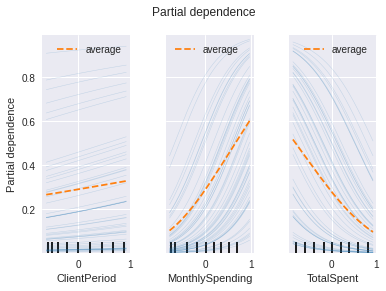

In [ ]:
from time import time
import matplotlib.pyplot as plt
from sklearn.inspection import partial_dependence
from sklearn.inspection import PartialDependenceDisplay



print("Computing partial dependence plots...")
tic = time()
features = num_cols #["MedInc", "AveOccup", "HouseAge", "AveRooms"]
display = PartialDependenceDisplay.from_estimator(
    clf,
    X_val,
    features,
    kind="both",
    subsample=50,
    n_jobs=3,
    grid_resolution=1000,
    random_state=0,
    ice_lines_kw={"color": "tab:blue", "alpha": 0.2, "linewidth": 0.5},
    pd_line_kw={"color": "tab:orange", "linestyle": "--"},
)
print(f"done in {time() - tic:.3f}s")
display.figure_.suptitle(
    "Partial dependence"
)

display.figure_.subplots_adjust(wspace=0.4, hspace=0.3)

Computing partial dependence plots...
done in 2.211s


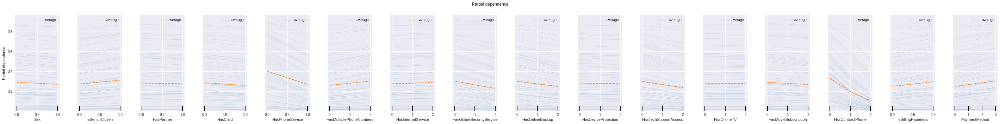

In [ ]:
from time import time
import matplotlib.pyplot as plt
from sklearn.inspection import partial_dependence
from sklearn.inspection import PartialDependenceDisplay


fig, ax = plt.subplots(figsize=(50, 5))
print("Computing partial dependence plots...")
tic = time()
features = cat_cols #["MedInc", "AveOccup", "HouseAge", "AveRooms"]
display = PartialDependenceDisplay.from_estimator(
    clf,
    X_train,
    features,
    kind="both",
    subsample=50,
    n_cols=16,
    ax=ax,
    n_jobs=3,
    grid_resolution=1000,
    random_state=0,
    ice_lines_kw={"color": "tab:blue", "alpha": 0.2, "linewidth": 0.5},
    pd_line_kw={"color": "tab:orange", "linestyle": "--"},
)
print(f"done in {time() - tic:.3f}s")
display.figure_.suptitle(
    "Partial dependence"
)

display.figure_.subplots_adjust(wspace=0.4, hspace=0.3)

# Предсказания

Лучшее качество: 0.85299.  
Параметры:  
*  depth: 8
*  iterations: 1000
*  learning_rate: 0.01
*  l2_leaf_reg: 3
*  border_count: 20
*  min_data_in_leaf: 1
*  random_state: 100
*  random_strength: 1
*  grow_policy: 'Lossguide'
*  thread_count: 4

In [30]:
best_model = clf
submission = pd.read_csv('/content/drive/MyDrive/DLS Kaggle/submission.csv', index_col='Id')
#test[bin_cols] = test[bin_cols].apply(LabelEncoder().fit_transform)
submission['Churn'] = best_model.predict_proba(test_data)[:, 1]
submission.to_csv('my_submission.csv')
submission

,Churn
Id,
0,0.042692
1,0.701934
2,0.669544
3,0.018484
4,0.008651
...,...
1756,0.134667
1757,0.012867
1758,0.809611


# Kaggle (5 баллов)

Как выставить баллы:

1) 1 >= roc auc > 0.84 это 5 баллов

2) 0.84 >= roc auc > 0.7 это 3 балла

3) 0.7 >= roc auc > 0.6 это 1 балл

4) 0.6 >= roc auc это 0 баллов


Для выполнения задания необходимо выполнить следующие шаги.
* Зарегистрироваться на платформе [kaggle.com](kaggle.com). Процесс выставления оценок будет проходить при подведении итогового рейтинга. Пожалуйста, укажите во вкладке Team -> Team name свои имя и фамилию в формате Имя_Фамилия (важно, чтобы имя и фамилия совпадали с данными на Stepik).
* Обучить модель, получить файл с ответами в формате .csv и сдать его в конкурс. Пробуйте и экспериментируйте. Обратите внимание, что вы можете выполнять до 20 попыток сдачи на kaggle в день.
* После окончания соревнования отправить в итоговый ноутбук с решением на степик. 
* После дедлайна проверьте посылки других участников по критериям. Для этого надо зайти на степик, скачать их ноутбук и проверить скор в соревновании.

## Partial dependence

Computing partial dependence plots...
done in 5.557s


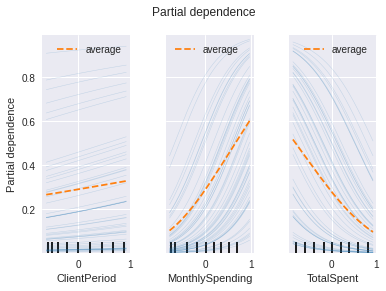

In [ ]:
from time import time
import matplotlib.pyplot as plt
from sklearn.inspection import partial_dependence
from sklearn.inspection import PartialDependenceDisplay



print("Computing partial dependence plots...")
tic = time()
features = num_cols #["MedInc", "AveOccup", "HouseAge", "AveRooms"]
display = PartialDependenceDisplay.from_estimator(
    clf,
    X_val,
    features,
    kind="both",
    subsample=50,
    n_jobs=3,
    grid_resolution=1000,
    random_state=0,
    ice_lines_kw={"color": "tab:blue", "alpha": 0.2, "linewidth": 0.5},
    pd_line_kw={"color": "tab:orange", "linestyle": "--"},
)
print(f"done in {time() - tic:.3f}s")
display.figure_.suptitle(
    "Partial dependence"
)

display.figure_.subplots_adjust(wspace=0.4, hspace=0.3)

Computing partial dependence plots...
done in 2.211s


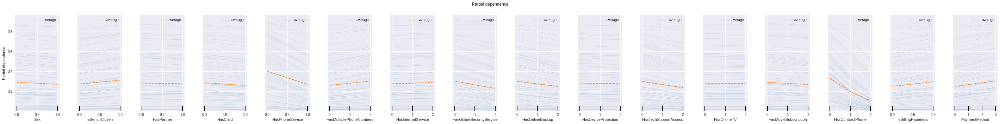

In [ ]:
from time import time
import matplotlib.pyplot as plt
from sklearn.inspection import partial_dependence
from sklearn.inspection import PartialDependenceDisplay


fig, ax = plt.subplots(figsize=(50, 5))
print("Computing partial dependence plots...")
tic = time()
features = cat_cols #["MedInc", "AveOccup", "HouseAge", "AveRooms"]
display = PartialDependenceDisplay.from_estimator(
    clf,
    X_train,
    features,
    kind="both",
    subsample=50,
    n_cols=16,
    ax=ax,
    n_jobs=3,
    grid_resolution=1000,
    random_state=0,
    ice_lines_kw={"color": "tab:blue", "alpha": 0.2, "linewidth": 0.5},
    pd_line_kw={"color": "tab:orange", "linestyle": "--"},
)
print(f"done in {time() - tic:.3f}s")
display.figure_.suptitle(
    "Partial dependence"
)

display.figure_.subplots_adjust(wspace=0.4, hspace=0.3)

##Legacy (старый код)

In [ ]:
clf = LogisticRegressionCV(solver='lbfgs', max_iter=1000)
    #clf = RandomForestClassifier(max_depth=10, random_state=0,class_weight={0:1,1:1},n_jobs=-1)
clf.fit(X_train, y_train)
train_predictions = clf.predict(X_test)
acc = accuracy_score(y_test, train_predictions)
roc = roc_auc_score(y_test, train_predictions)
print(acc, roc)

0.7930045871559633 0.7009464571664326


In [ ]:
preds = icat.predict_proba(X_val_cat)[:,1]

In [ ]:
params = {'n_estimators': [200, 298, 300, 400], 
          'max_depth': [1, 2, 3, 4], 
          'subsample': np.linspace(0.55, 0.7, 10), 
          'l2_leaf_reg': np.linspace(3, 5, 5), 
          'random_strength': np.linspace(1.1, 1.2, 10), 
          'learning_rate': np.linspace(0.01, 0.2, 10),
          #'eta': np.linspace(0.09, 0.1, 10), 
          'min_data_in_leaf': [1, 2, 3, 4, 5], 
          'random_state': [777]}

In [ ]:
kitten = CatBoostClassifier(**{'grow_policy': 'Lossguide','eval_metric': 'AUC:hints=skip_train~false', 
                                        'loss_function': 'Logloss', 'auto_class_weights': 'Balanced', 
                                        'logging_level': 'Silent'})

In [ ]:
kitten = CatBoostClassifier(cat_features=cat_cols)

In [ ]:
pool_train = Pool(cat_data, label=y, cat_features=cat_cols)

In [ ]:
grid = {'n_estimators': [200, 300], 
          'max_depth': [1, 2, 3, 4, 5, 6, 7], 
          'subsample': np.linspace(0.55, 0.95, 10), 
          'l2_leaf_reg': np.linspace(3, 5, 5), 
          'random_strength': np.linspace(1.1, 1.2, 10), 
          'learning_rate': np.linspace(0.01, 0.2, 10),
          #'eta': np.linspace(0.09, 0.1, 10), 
          'min_data_in_leaf': [1, 2, 3, 4, 5], 
          'random_state': [0, 1, 32, 777]}

In [ ]:
res = kitten.grid_search(grid, X=cat_data, y=y, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Выходные данные были обрезаны до нескольких последних строк (5000).
29:	learn: 0.4140720	test: 0.3843440	best: 0.3843440 (29)	total: 410ms	remaining: 2.33s
30:	learn: 0.4133682	test: 0.3838074	best: 0.3838074 (30)	total: 473ms	remaining: 2.58s
31:	learn: 0.4130073	test: 0.3837614	best: 0.3837614 (31)	total: 525ms	remaining: 2.76s
32:	learn: 0.4124671	test: 0.3832538	best: 0.3832538 (32)	total: 559ms	remaining: 2.83s
33:	learn: 0.4116134	test: 0.3827915	best: 0.3827915 (33)	total: 608ms	remaining: 2.97s
34:	learn: 0.4114215	test: 0.3827474	best: 0.3827474 (34)	total: 652ms	remaining: 3.08s
35:	learn: 0.4110171	test: 0.3825768	best: 0.3825768 (35)	total: 708ms	remaining: 3.22s
36:	learn: 0.4103486	test: 0.3818542	best: 0.3818542 (36)	total: 862ms	remaining: 3.8s
37:	learn: 0.4095798	test: 0.3810012	best: 0.3810012 (37)	total: 911ms	remaining: 3.88s
38:	learn: 0.4091864	test: 0.3806575	best: 0.3806575 (38)	total: 966ms	remaining: 3.99s
39:	learn: 0.4087214	test: 0.3806945	best: 0.3806575 

KeyboardInterrupt: ignored

In [ ]:
kitten.grid_search(params, X=pool_train)

Выходные данные были обрезаны до нескольких последних строк (5000).
1:	loss: 0.8715632	best: 0.8715632 (1)	total: 5.04s	remaining: 3h 29m 52s
2:	loss: 0.8724947	best: 0.8724947 (2)	total: 6.98s	remaining: 3h 13m 41s
3:	loss: 0.8719143	best: 0.8724947 (2)	total: 8.91s	remaining: 3h 5m 30s
4:	loss: 0.8715083	best: 0.8724947 (2)	total: 10.8s	remaining: 3h 19s
5:	loss: 0.8724588	best: 0.8724947 (2)	total: 12.8s	remaining: 2h 56m 53s
6:	loss: 0.8709757	best: 0.8724947 (2)	total: 14.7s	remaining: 2h 54m 55s
7:	loss: 0.8719668	best: 0.8724947 (2)	total: 16.6s	remaining: 2h 53m 9s
8:	loss: 0.8726284	best: 0.8726284 (8)	total: 18.6s	remaining: 2h 51m 47s
9:	loss: 0.8717996	best: 0.8726284 (8)	total: 20.5s	remaining: 2h 50m 42s
10:	loss: 0.8728075	best: 0.8728075 (10)	total: 22.5s	remaining: 2h 49m 45s
11:	loss: 0.8719262	best: 0.8728075 (10)	total: 24.4s	remaining: 2h 49m 18s
12:	loss: 0.8727430	best: 0.8728075 (10)	total: 26.4s	remaining: 2h 48m 34s
13:	loss: 0.8726547	best: 0.8728075 (10)	tot

{'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               45,
               46,
               47,
               48,
               49,
             

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(cat_data, y, test_size=0.3, random_state=777)

In [ ]:
pool_train = Pool(X_train_cat, label=y_train_cat, cat_features=cat_cols)

In [ ]:
icat = CatBoostClassifier(**{'loss_function': 'Logloss',
                                'logging_level': 'Silent',
                                'auto_class_weights': 'Balanced',
                                'eval_metric': 'AUC:hints=skip_train~false',
                                'grow_policy': 'Lossguide',
                                'min_data_in_leaf': 5,
                                'random_seed': 777,
                                'depth': 3,
                                'iterations': 298,
                                'subsample': 0.5611111111111111,
                                'random_strength': 1.1333333333333333,
                                'learning_rate': 0.09222222222222222,
                                'l2_leaf_reg': 3.375})
icat.fit(pool_train)

In [ ]:
roc_auc_score(y_val_cat, preds)

0.8412433155080214

In [ ]:
icat = CatBoostClassifier(**{'loss_function': 'Logloss',
                                'logging_level': 'Silent',
                                'auto_class_weights': 'Balanced',
                                'eval_metric': 'AUC:hints=skip_train~false',
                                'grow_policy': 'SymmetricTree',
                                'min_data_in_leaf': 5,
                                'random_seed': 777,
                                'depth': 6,
                                'iterations': 1000,
                                'subsample': 0.5611111111111111,
                                'random_strength': 1.1333333333333333,
                                'learning_rate': 0.09222222222222222,
                                'l2_leaf_reg': 3.375})
icat.fit(pool_train)